In [1]:
import numpy as np
import matplotlib.pyplot as plt

# interpolate log

In [2]:
def interpolating_log(x, a):
    
    #return(y_0 + (x**a - x_0**a)/(x_1**a - x_0**a) * (y_1 - y_0))
    return((a)*x + (1-a)*np.log(x))

In [3]:
x_ = np.linspace(0.01, 10, 1000+1)

y_a1 = interpolating_log(x_, a=1)
y_a78 = interpolating_log(x_, a=7/8)
y_a34 = interpolating_log(x_, a=3/4)
y_a12 = interpolating_log(x_, a=1/2)
y_a14 = interpolating_log(x_, a=1/4)
y_a18 = interpolating_log(x_, a=1/8)
y_a0 = interpolating_log(x_, a=0.001)

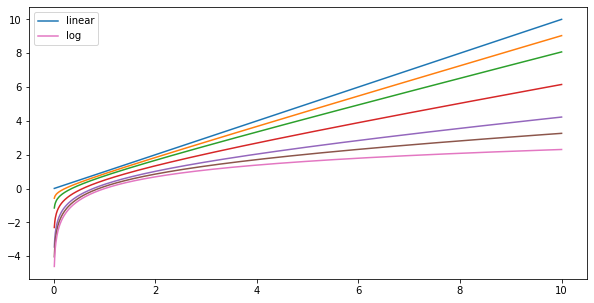

In [4]:
plt.figure(figsize=(10, 5))

plt.plot(x_, y_a1, label='linear')
plt.plot(x_, y_a78)
plt.plot(x_, y_a34)
plt.plot(x_, y_a12)
plt.plot(x_, y_a14)
plt.plot(x_, y_a18)
plt.plot(x_, y_a0, label='log')
plt.legend()
plt.show();

# interpolate exp

In [5]:
# just use a convex combination of the two functions

def interpolating_exp(x, a): 
    
    return((1-a)*x+ a*np.exp(x))

In [6]:
x_ = np.linspace(0.001, 2, 1000+1)

y_exp_a1 = interpolating_exp(x_, a=1)
y_exp_a78 = interpolating_exp(x_, a=7/8)
y_exp_a34 = interpolating_exp(x_, a=3/4)
y_exp_a12 = interpolating_exp(x_, a=1/2)
y_exp_a14 = interpolating_exp(x_, a=1/4)
y_exp_a18 = interpolating_exp(x_, a=1/8)
y_exp_a0 = interpolating_exp(x_, a=0.001)

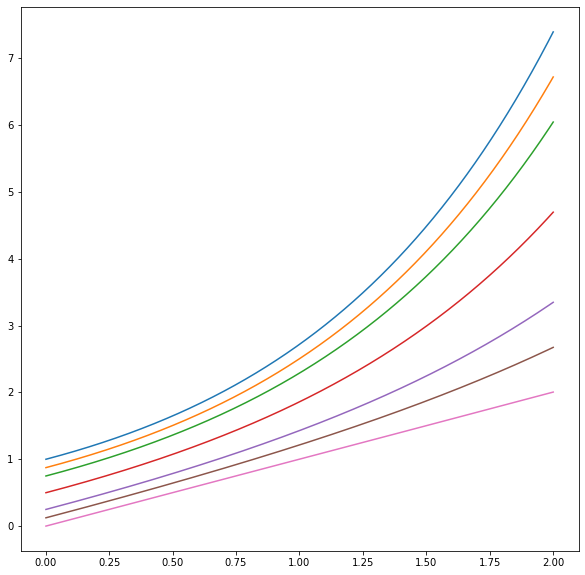

In [7]:
plt.figure(figsize=(10, 10))

plt.plot(x_, y_exp_a1)
plt.plot(x_, y_exp_a78)
plt.plot(x_, y_exp_a34)
plt.plot(x_, y_exp_a12)
plt.plot(x_, y_exp_a14)
plt.plot(x_, y_exp_a18)
plt.plot(x_, y_exp_a0)
plt.show();

In [8]:
# test cases for interpolating exp

print(interpolating_exp(1, a=1))
print(interpolating_exp(0, a=1))
print(interpolating_exp(1, a=0))
print(interpolating_exp(0, a=0))

2.718281828459045
1.0
1.0
0.0


# interpolating the Gamma

In [9]:
from scipy.special import gamma as gamma_func

def gamma_pdf(x, a, l):
    r = l**a/gamma_func(a) * (x ** (a-1)) * (np.exp(-x*l))
    return(r)

def gamma_pdf_t_log(x, a, l):
    c = gamma_func(a) /l**a
    r = 1/c * (np.exp(x) ** a) * (np.exp(-np.exp(x) * l))
    return(r)

def gamma_pdf_interpolating_log(x, a, l, d):
    c1 = gamma_func(a) /l**a
    c2 = l**a/gamma_func(a)
    c = (1-d)*c1 + d*c2
    r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
    return(r)

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


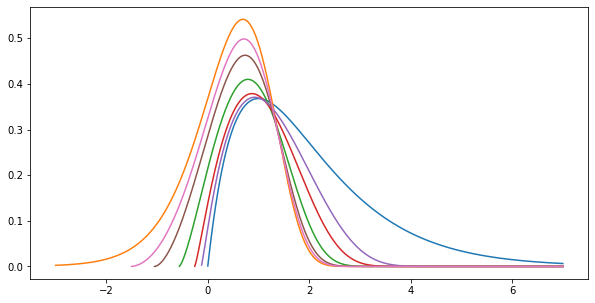

In [10]:
x_P = np.linspace(0.001, 7, 1000+1)
x_R = np.linspace(-3, 7, 1000+1)
x_R12 = np.linspace(-1.2, 7, 1000+1)
x_R14 = np.linspace(-1, 7, 1000+1)
x_R18 = np.linspace(-1, 7, 1000+1)
x_R34 = np.linspace(-1.5, 7, 1000+1)
x_R78 = np.linspace(-1.5, 7, 1000+1)

a1, l1 = 2, 1
gamma1_pdf = gamma_pdf(x_P, a1, l1)
gamma1_pdf_log = gamma_pdf_t_log(x_R, a1, l1)
gamma1_pdf_log_12 = gamma_pdf_interpolating_log(x_R12, a1, l1, d=1/2)
gamma1_pdf_log_14 = gamma_pdf_interpolating_log(x_R14, a1, l1, d=1/4)
gamma1_pdf_log_18 = gamma_pdf_interpolating_log(x_R18, a1, l1, d=1/8)
gamma1_pdf_log_34 = gamma_pdf_interpolating_log(x_R34, a1, l1, d=3/4)
gamma1_pdf_log_78 = gamma_pdf_interpolating_log(x_R78, a1, l1, d=7/8)

plt.figure(figsize=(10, 5))

plt.plot(x_P, gamma1_pdf)
plt.plot(x_R, gamma1_pdf_log)
plt.plot(x_R12, gamma1_pdf_log_12)
plt.plot(x_R14, gamma1_pdf_log_14)
plt.plot(x_R18, gamma1_pdf_log_18)
plt.plot(x_R34, gamma1_pdf_log_34)
plt.plot(x_R78, gamma1_pdf_log_78)
plt.show();

## interpolate for real now

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


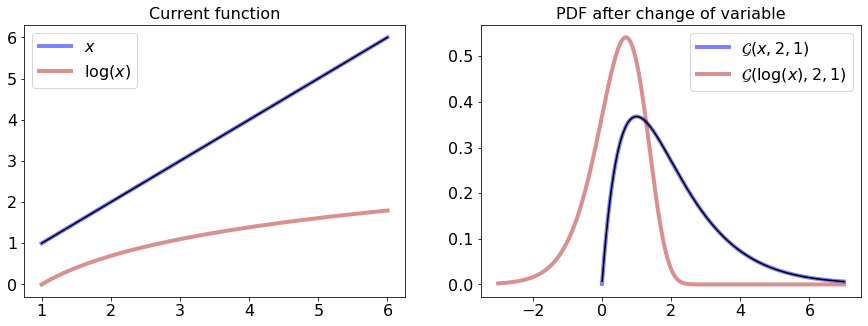

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


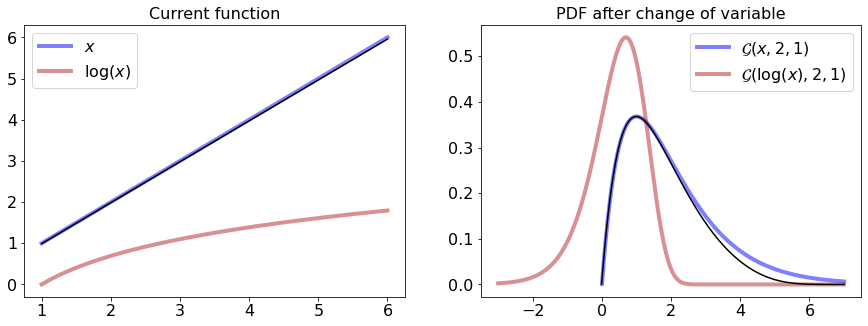

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


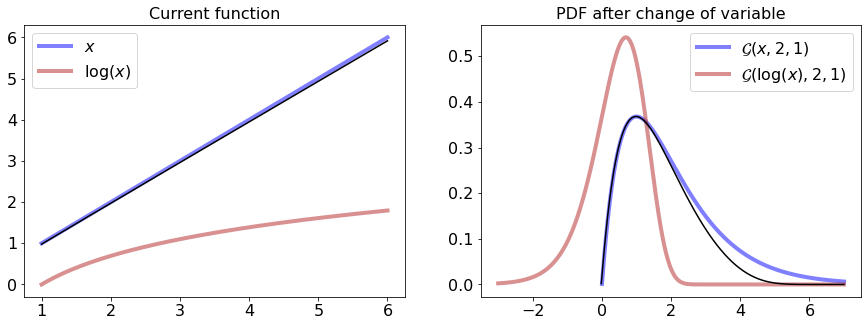

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


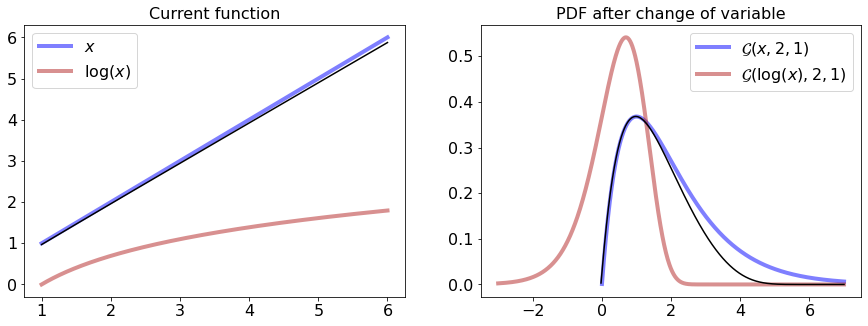

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


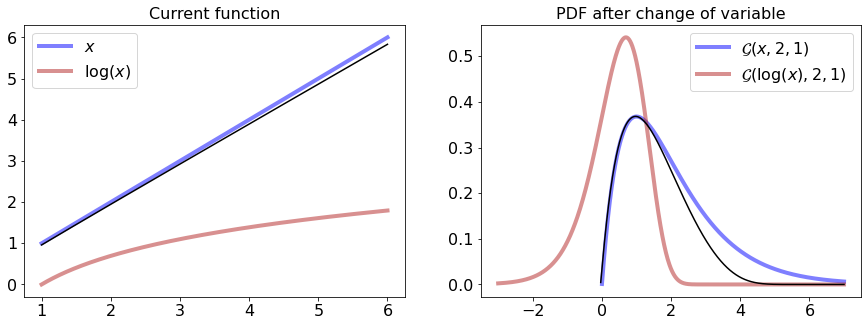

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


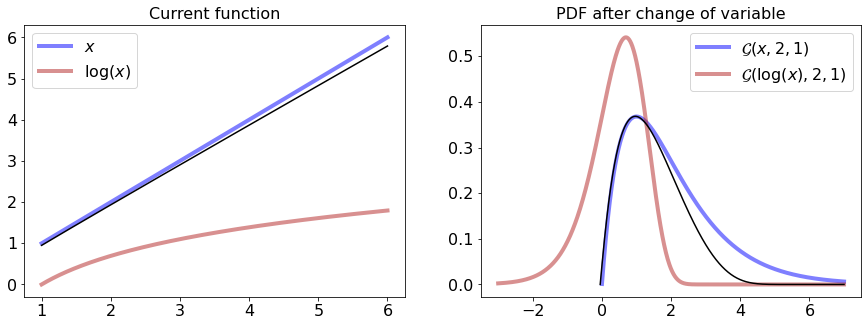

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


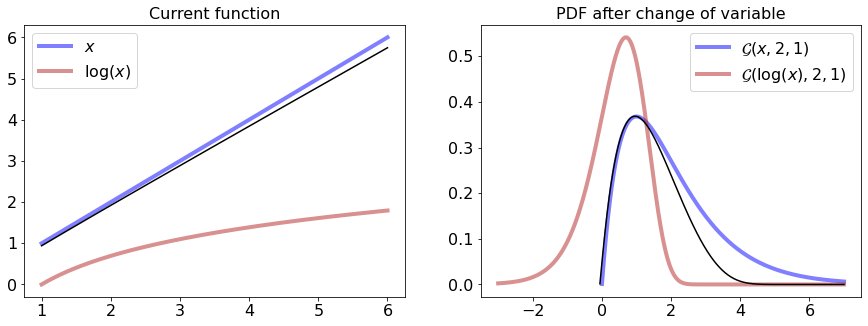

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


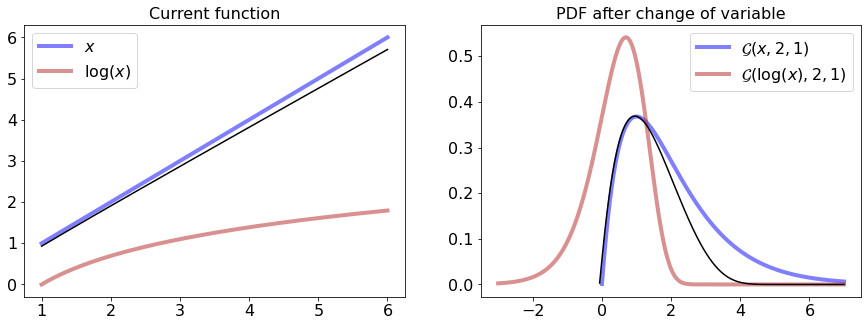

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


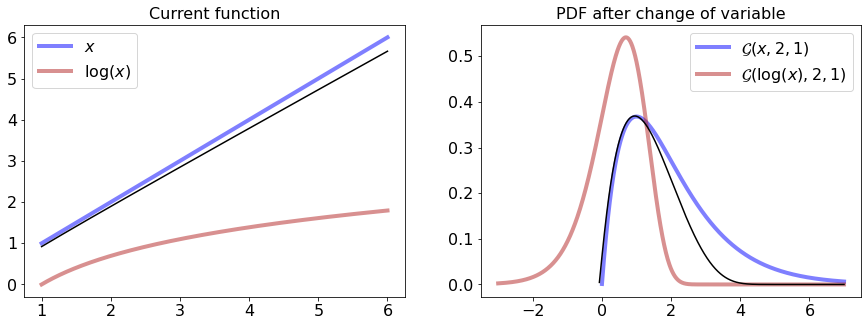

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


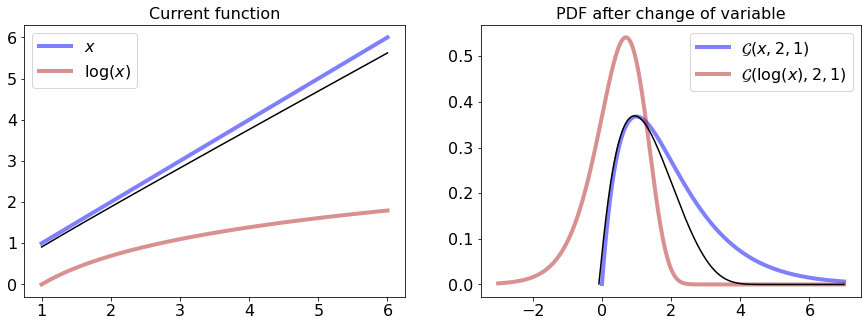

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


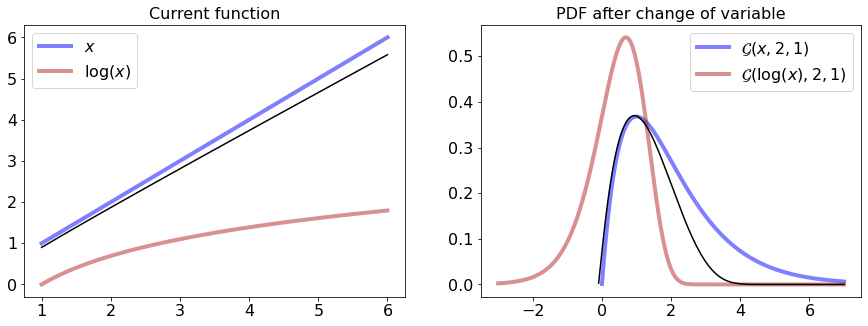

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


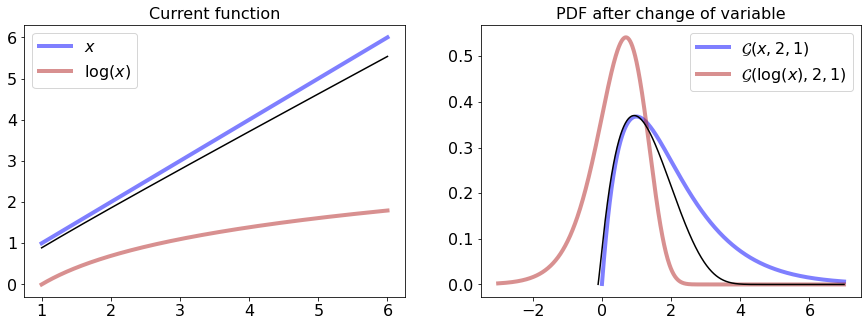

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


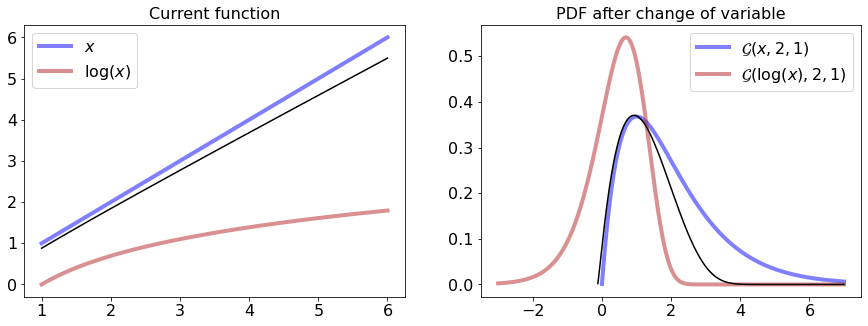

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


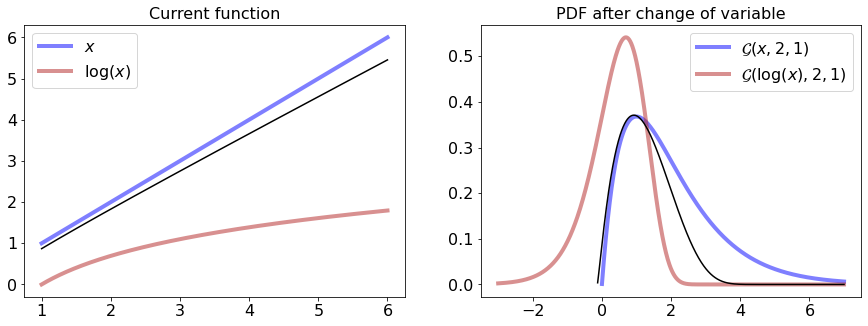

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


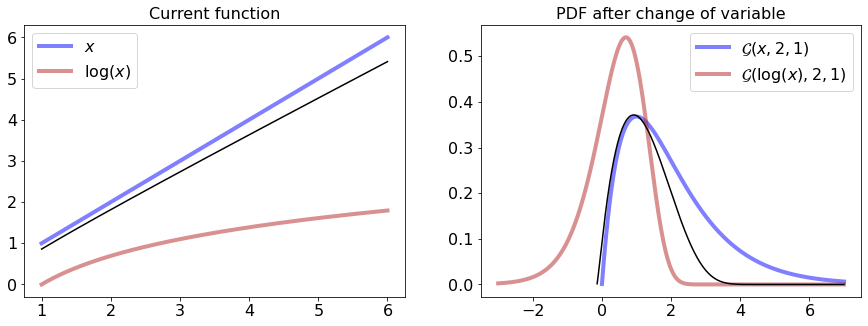

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


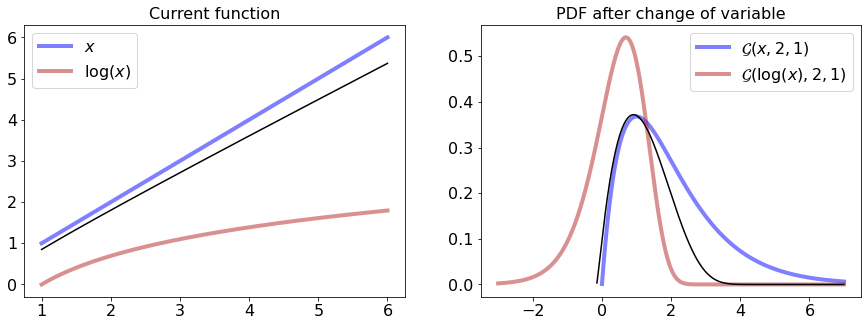

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


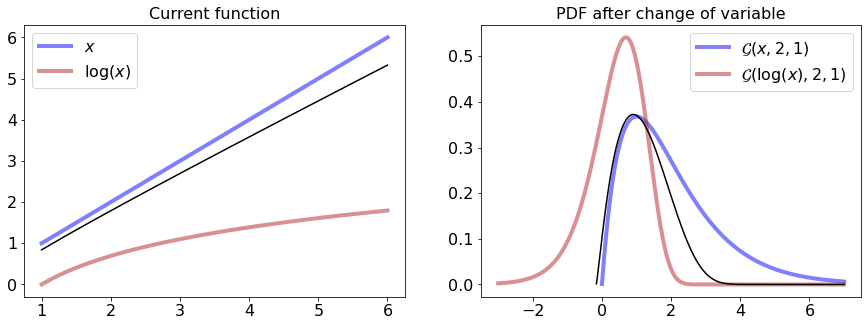

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


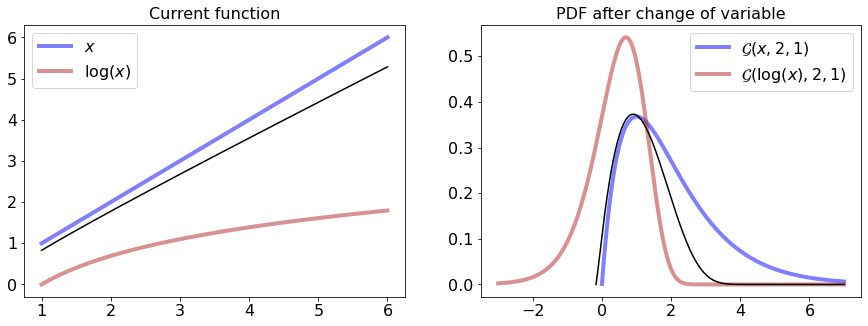

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


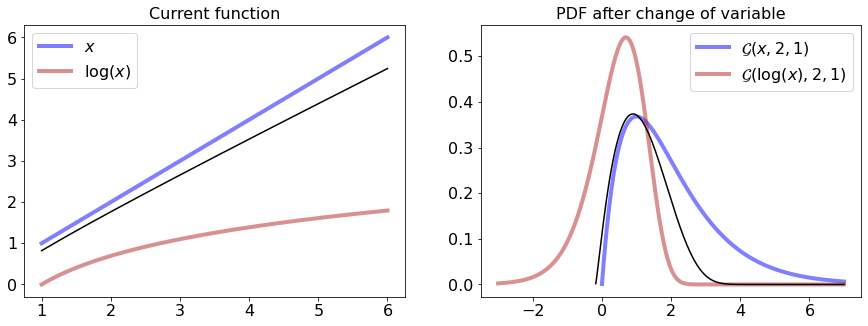

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


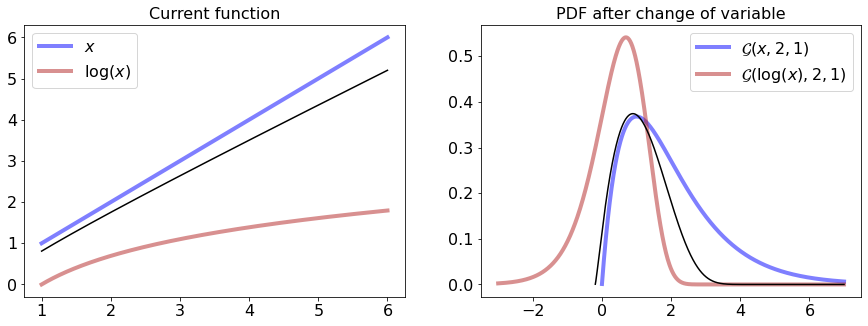

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


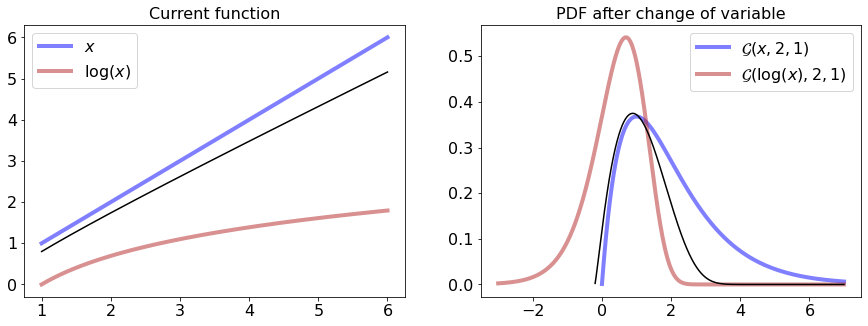

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


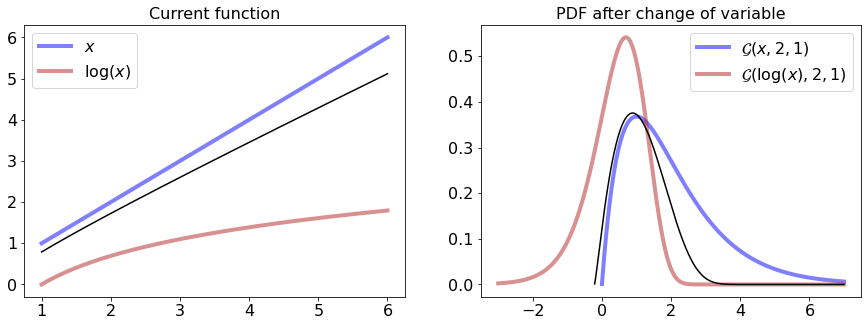

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


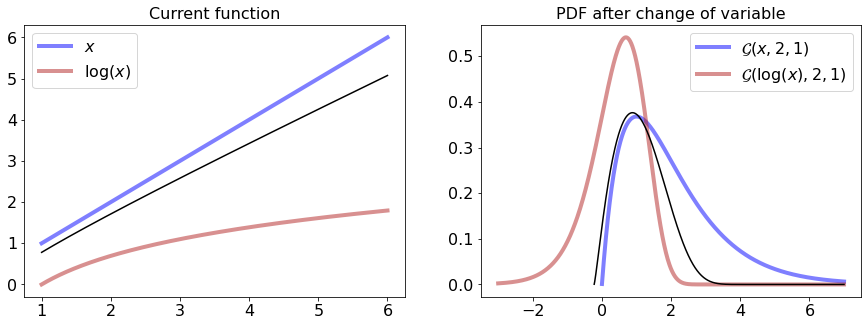

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


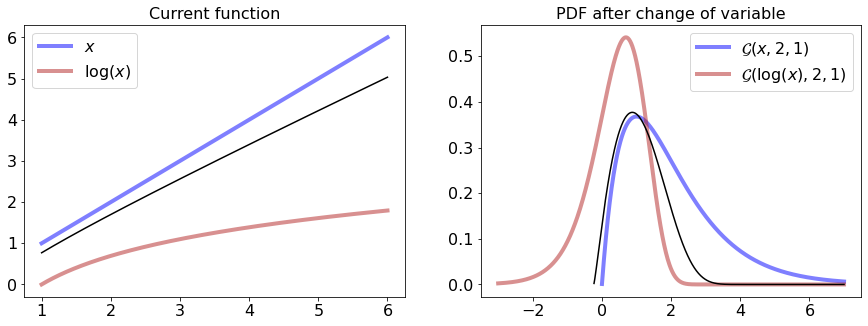

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


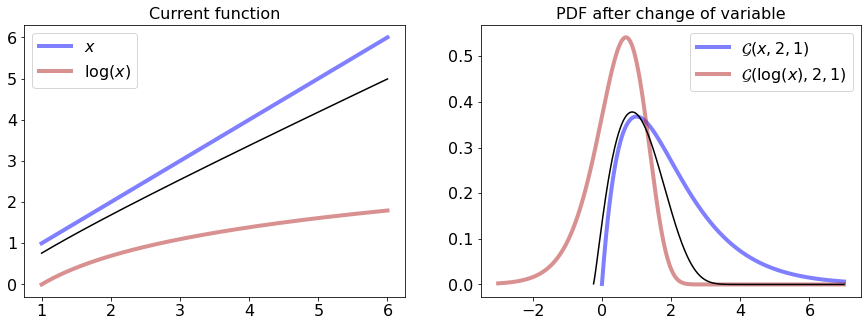

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


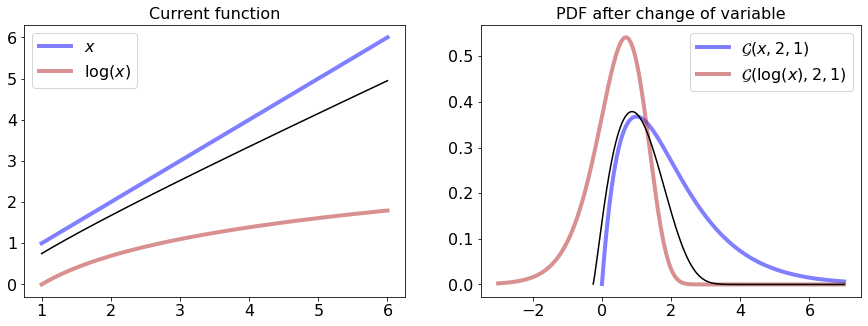

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


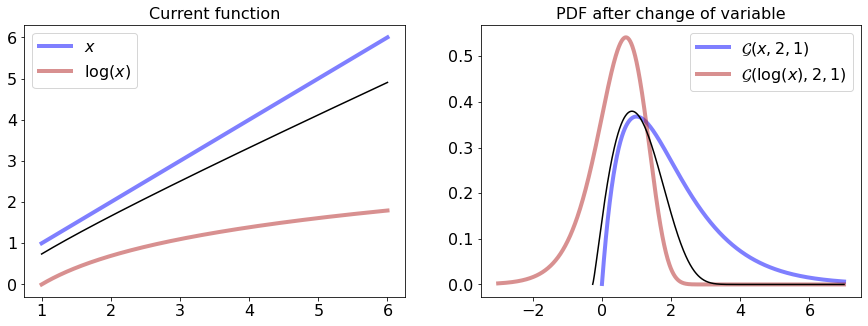

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


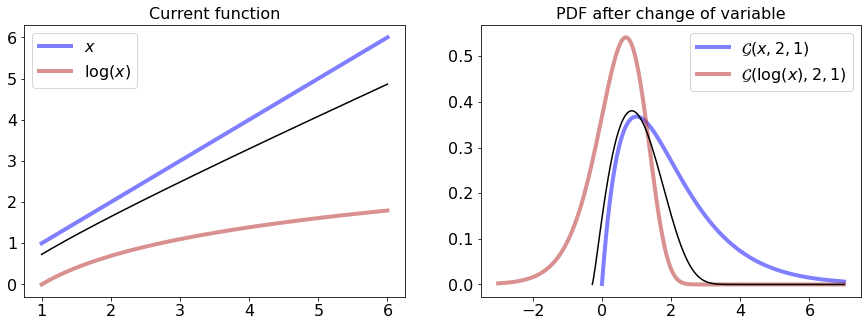

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


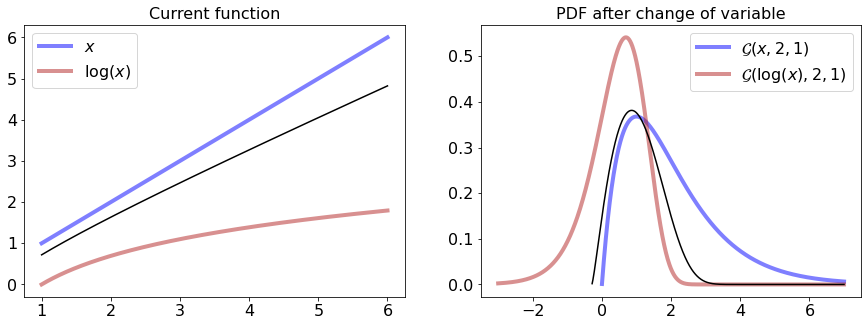

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


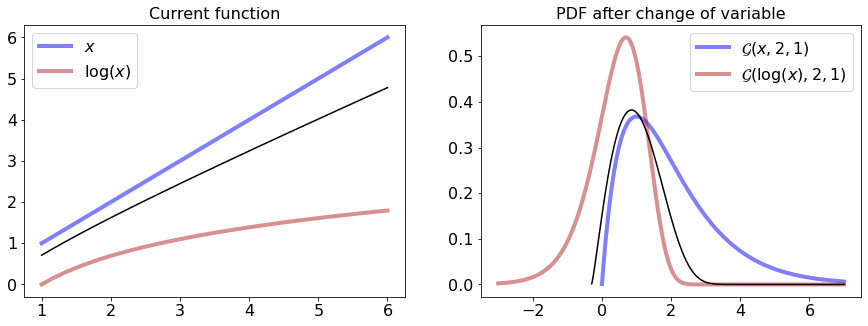

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


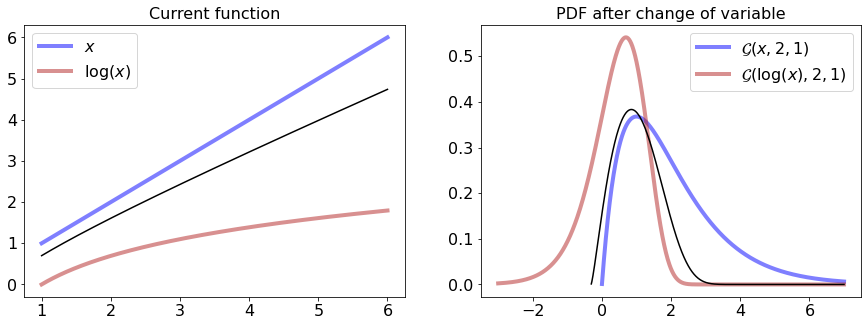

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


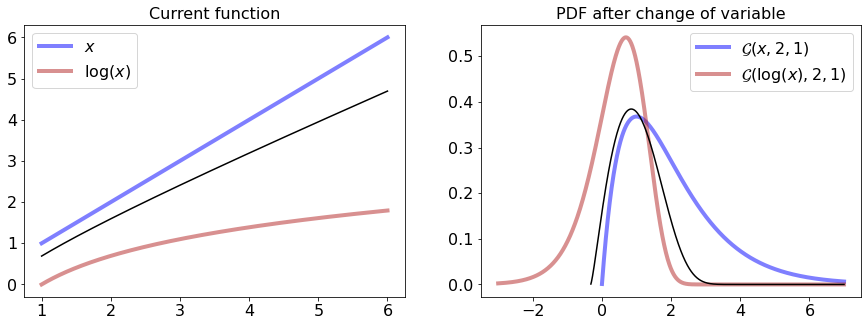

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


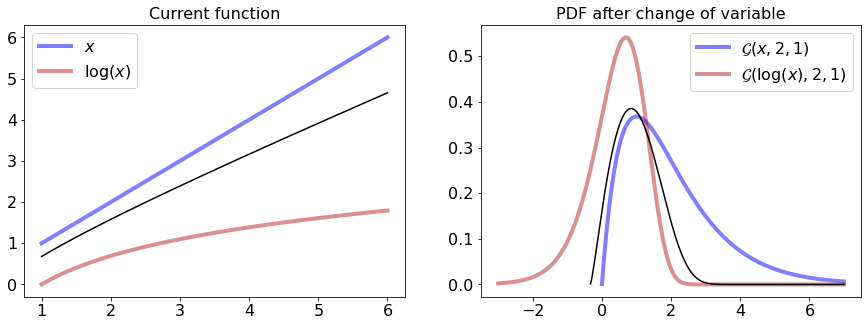

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


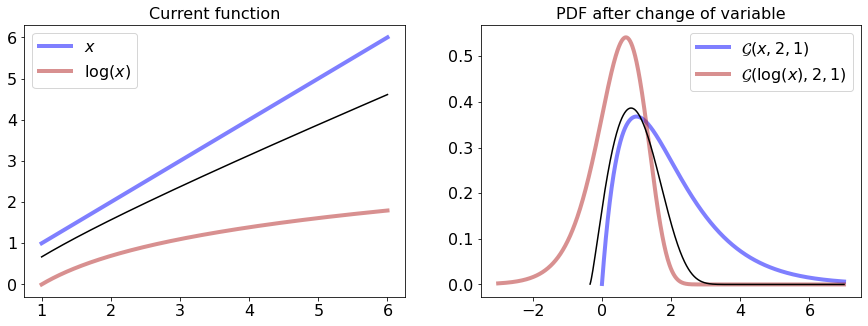

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


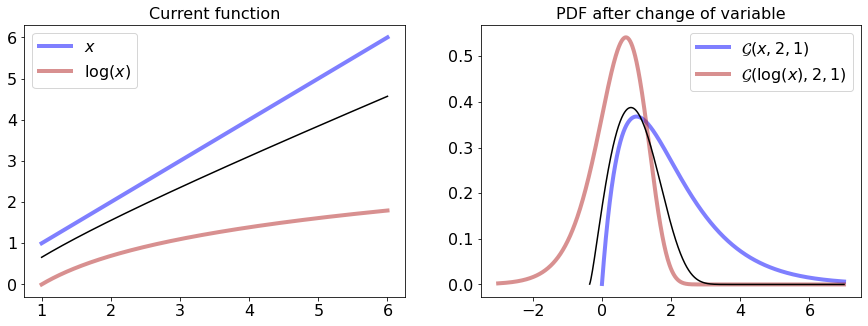

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


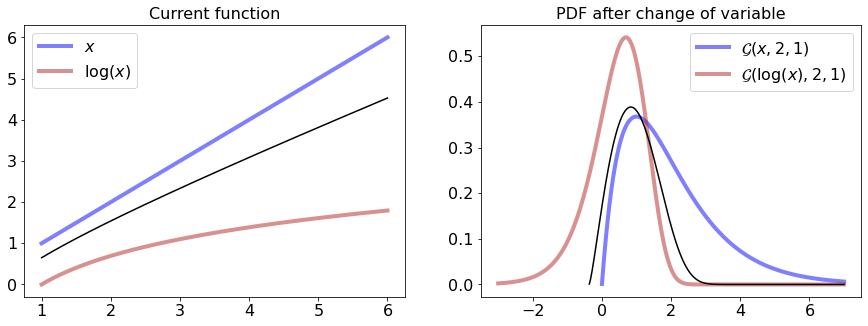

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


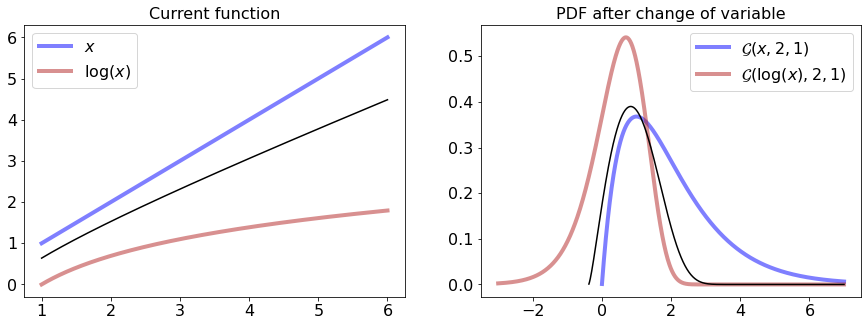

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


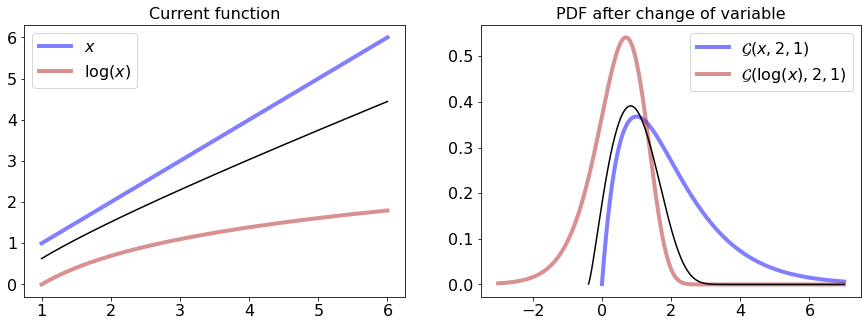

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


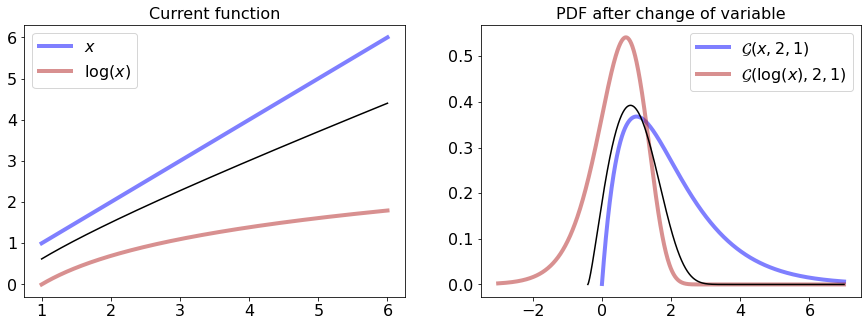

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


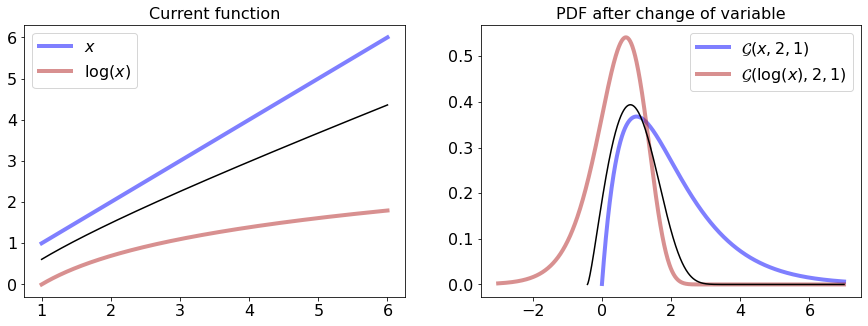

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


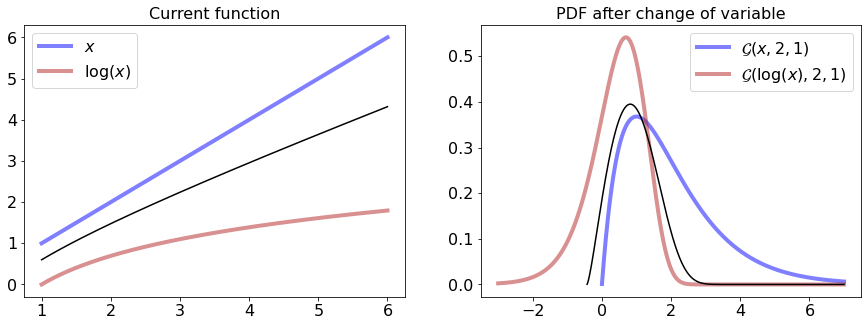

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


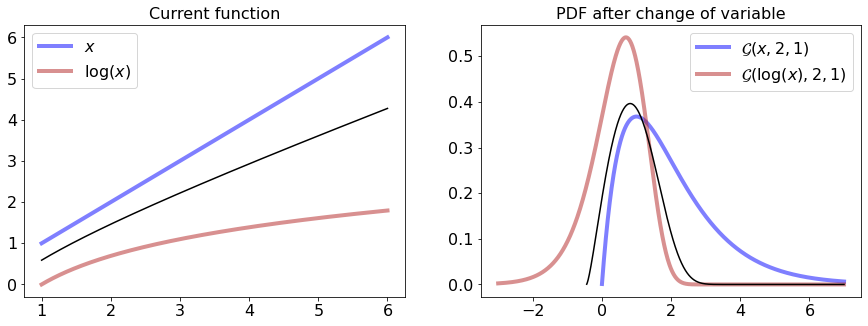

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


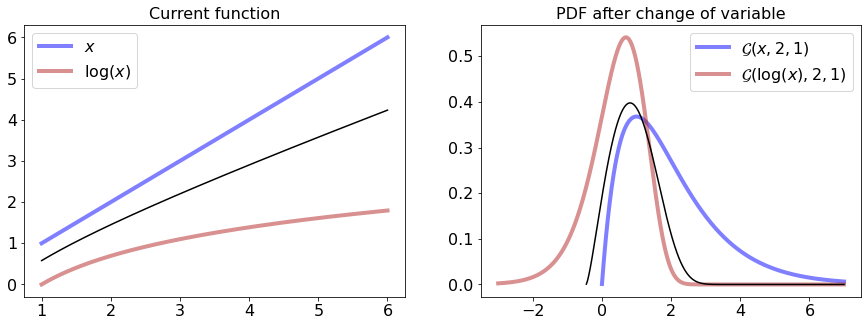

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


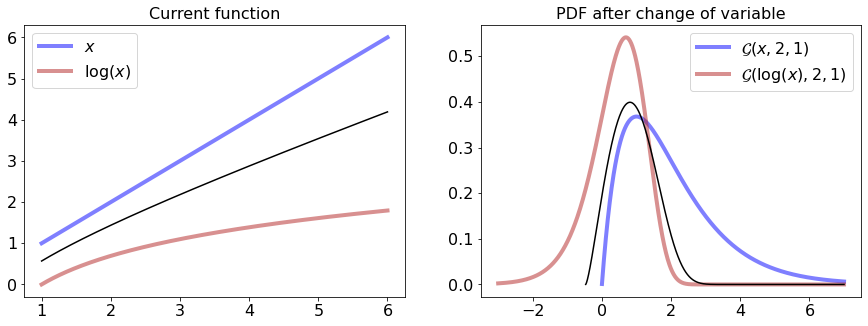

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


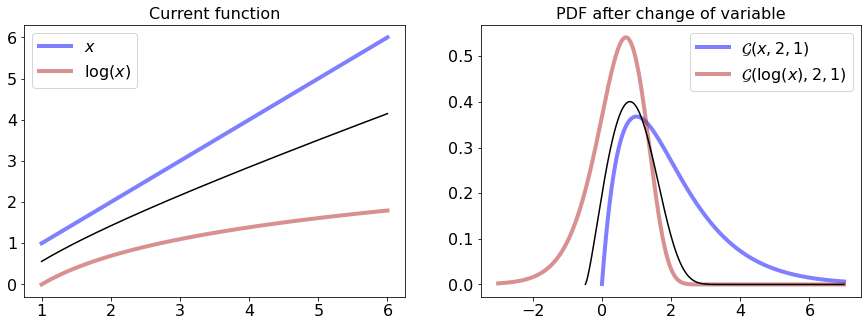

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


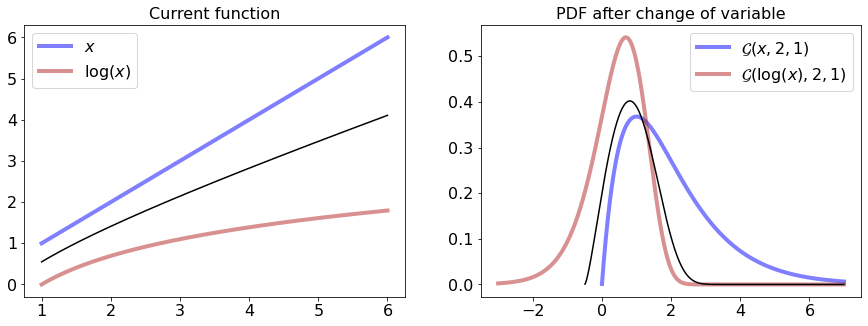

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


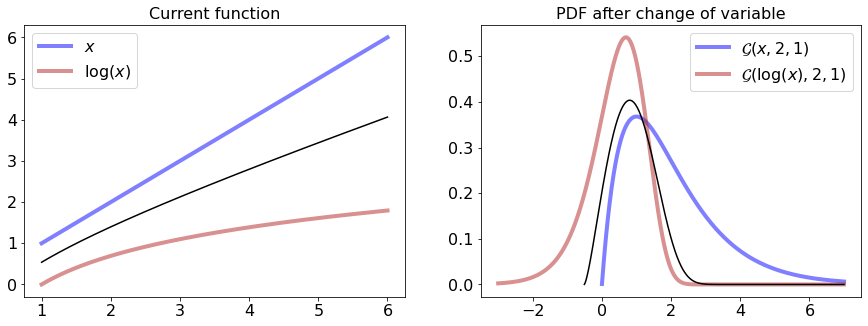

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


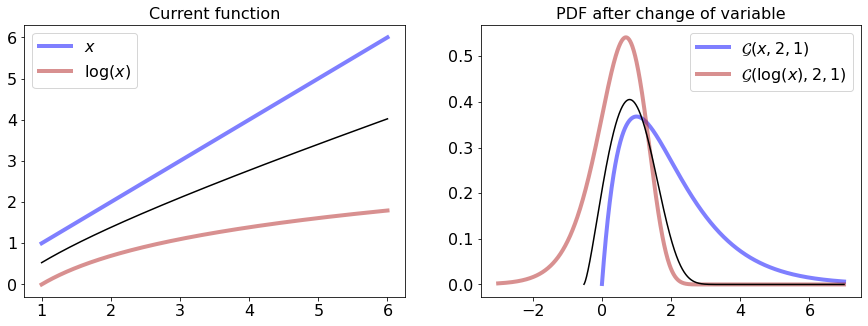

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


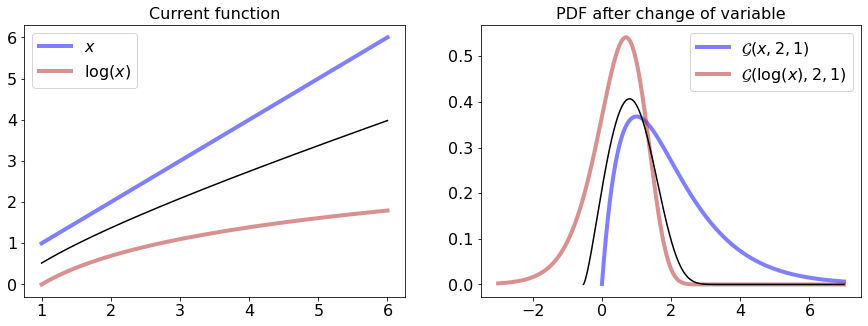

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


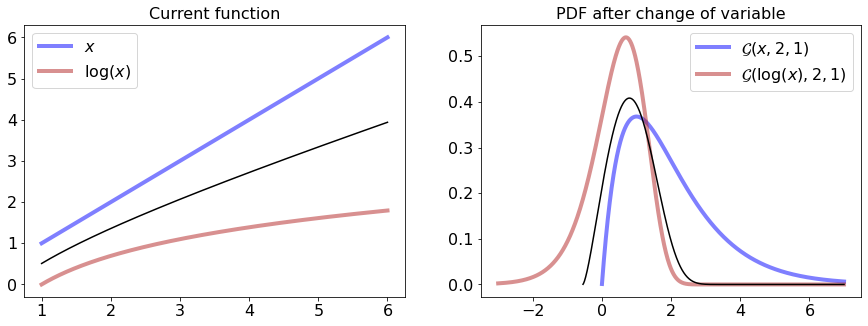

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


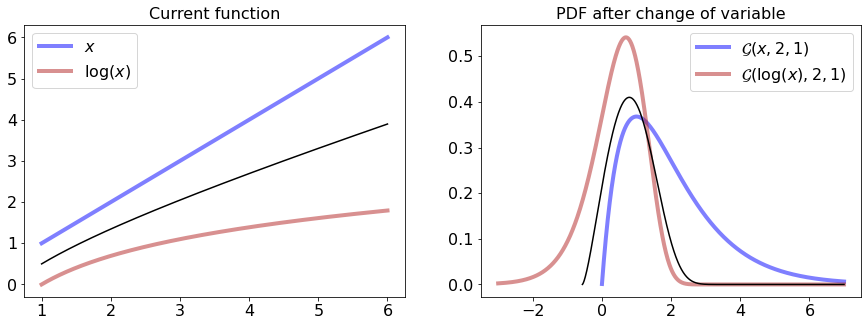

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


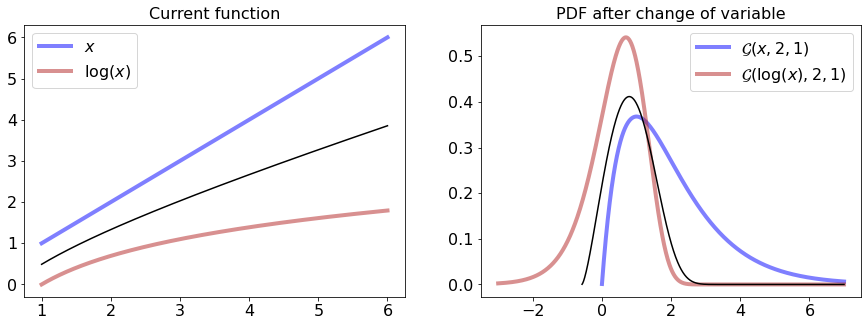

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


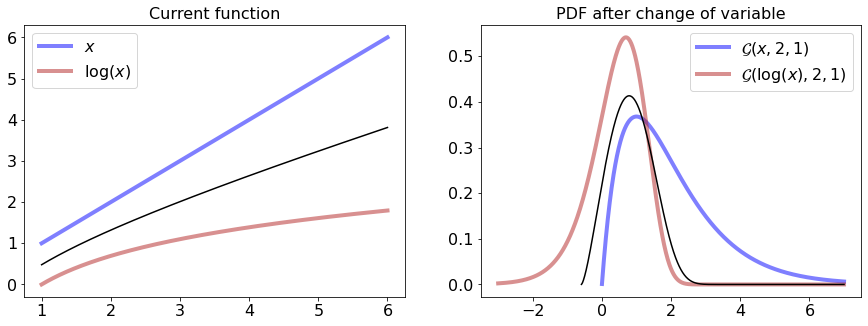

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


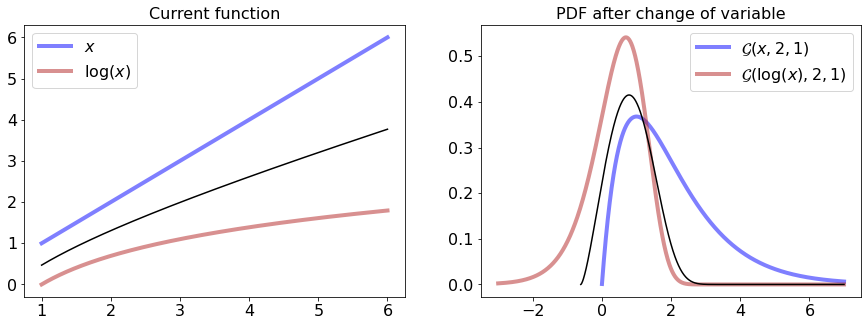

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


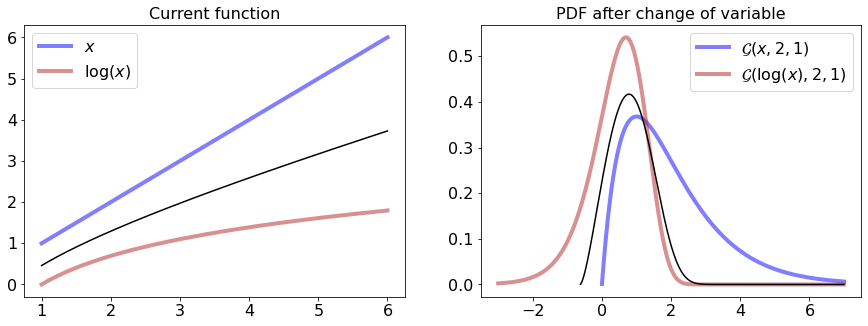

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


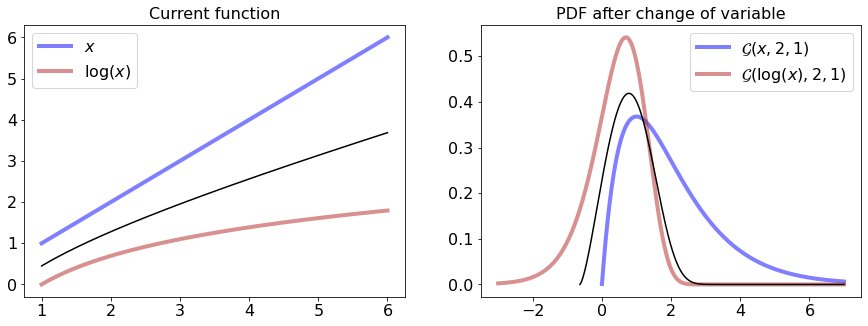

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


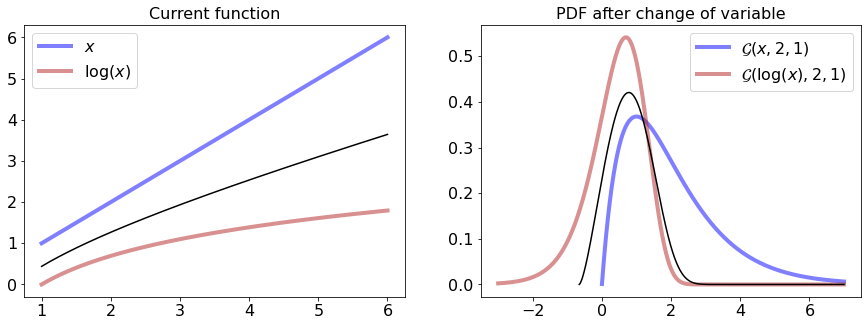

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


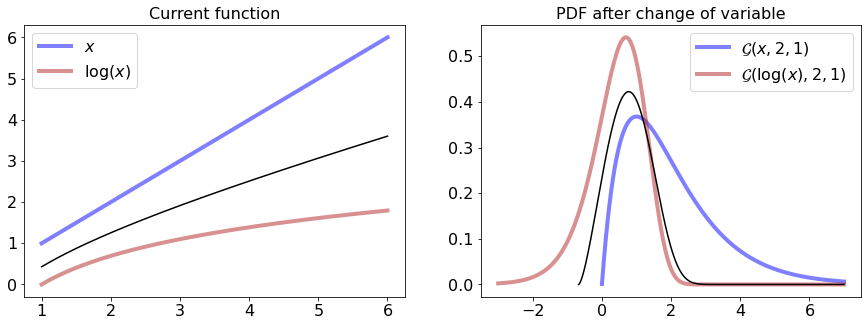

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


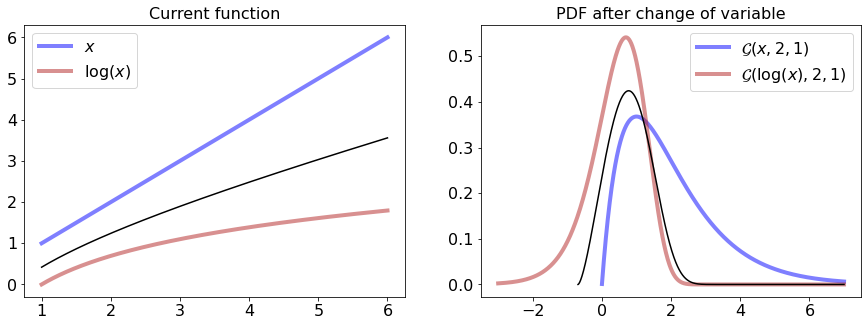

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


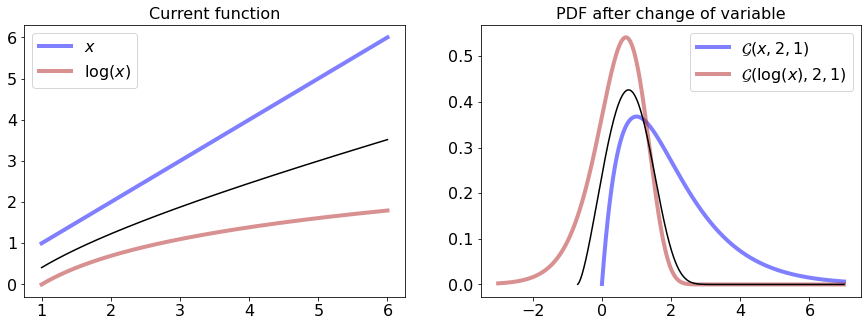

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


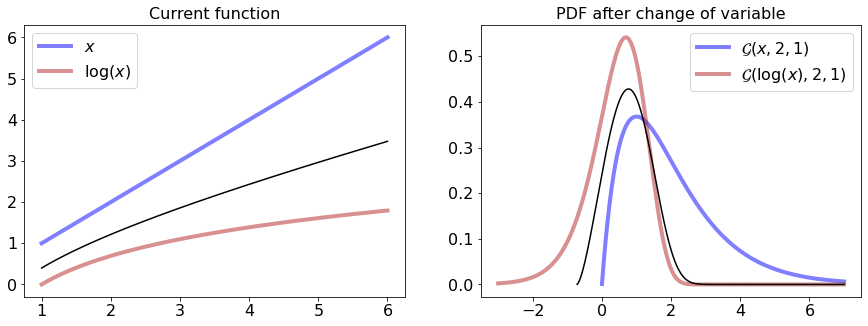

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


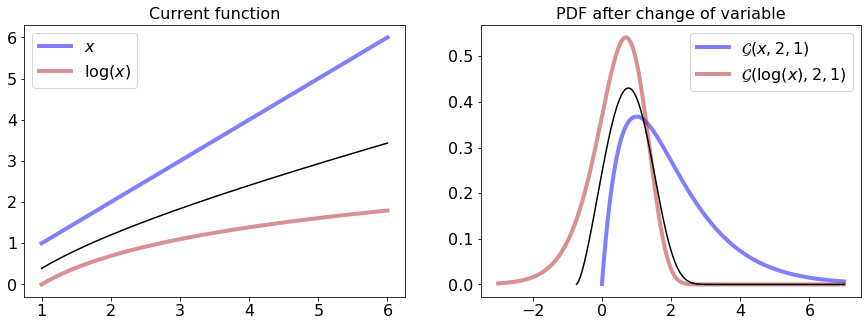

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


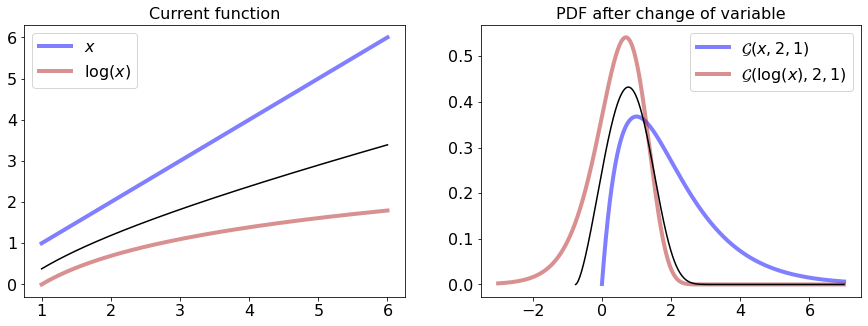

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


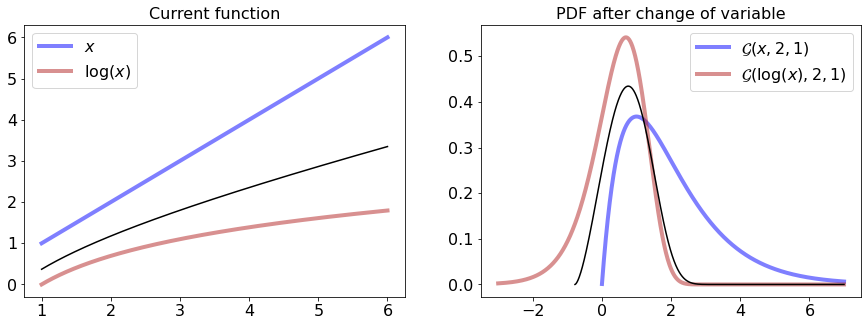

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


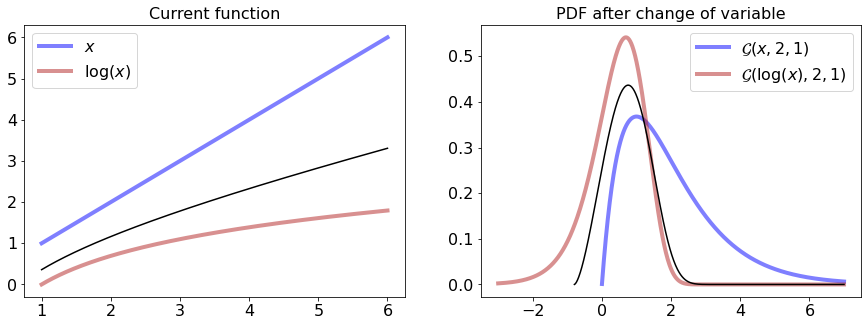

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


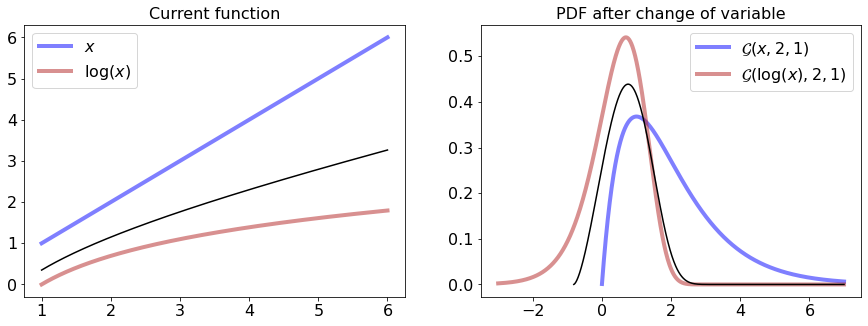

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


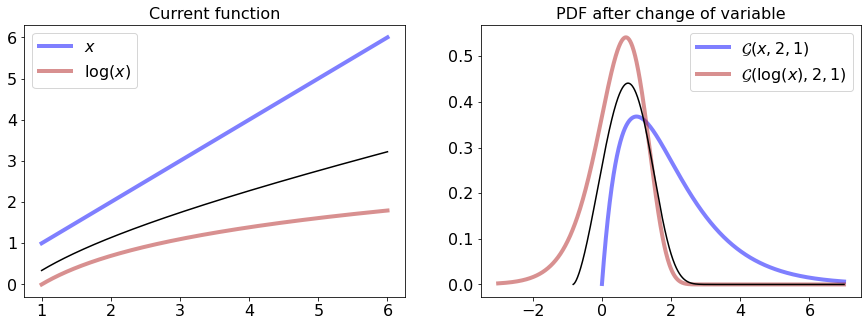

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


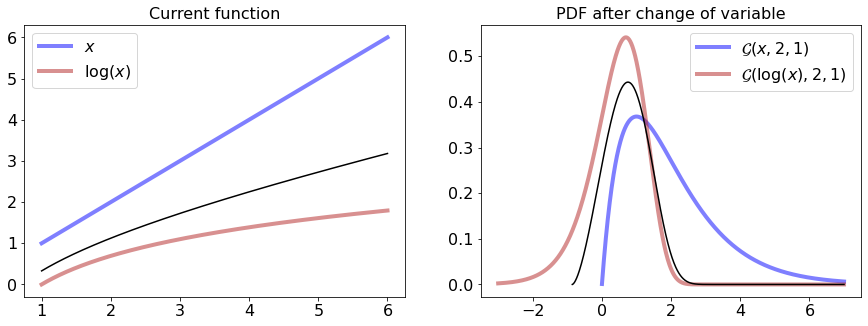

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


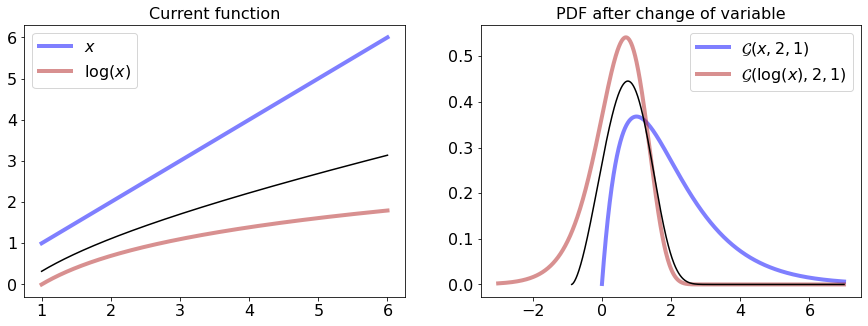

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


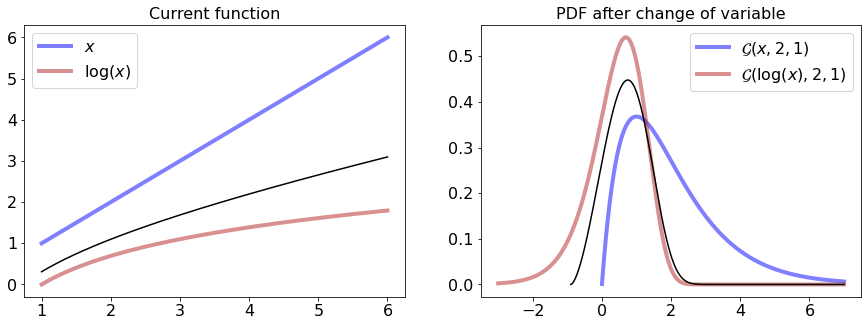

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


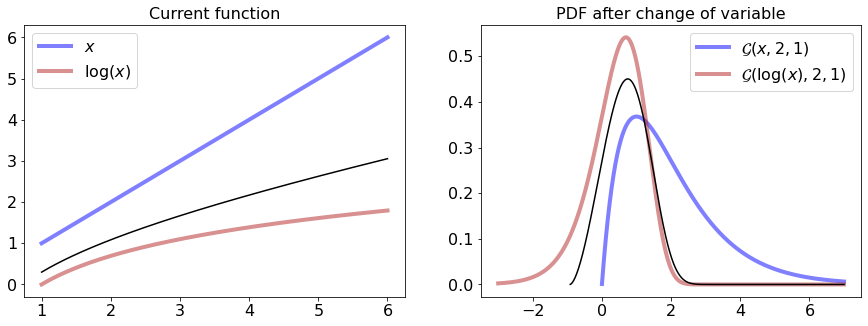

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


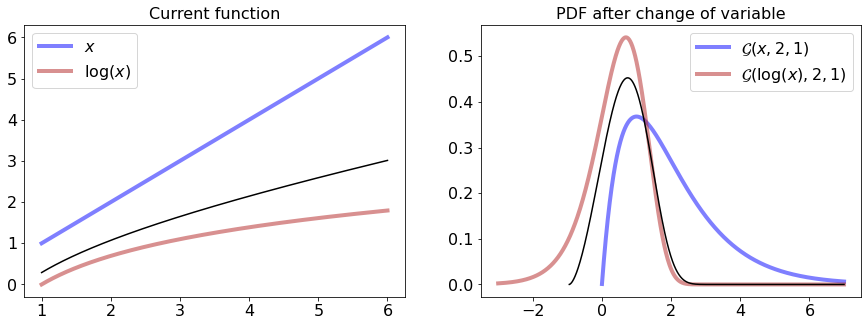

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


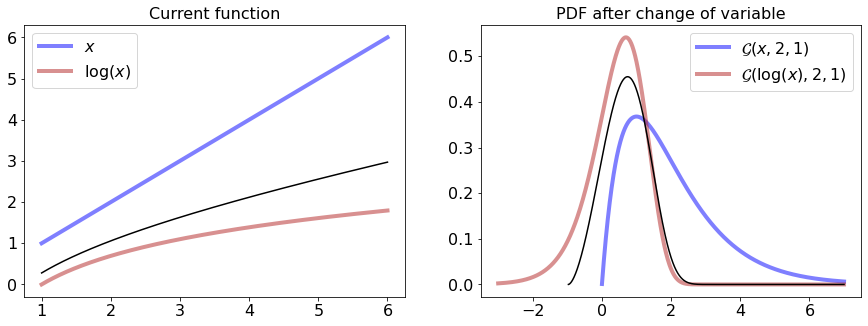

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


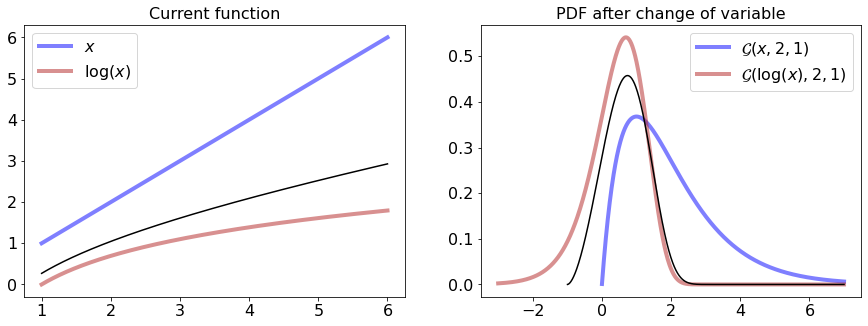

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


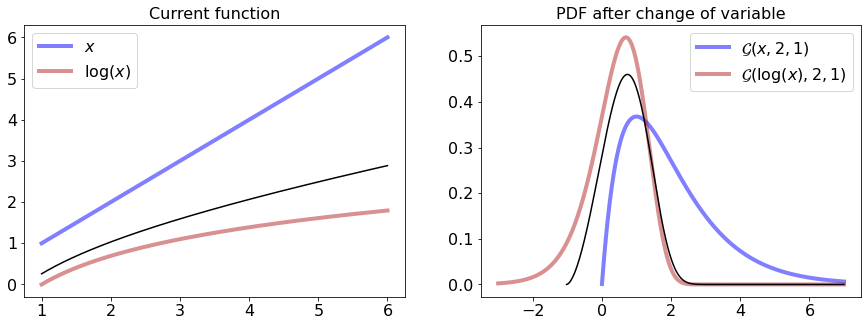

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


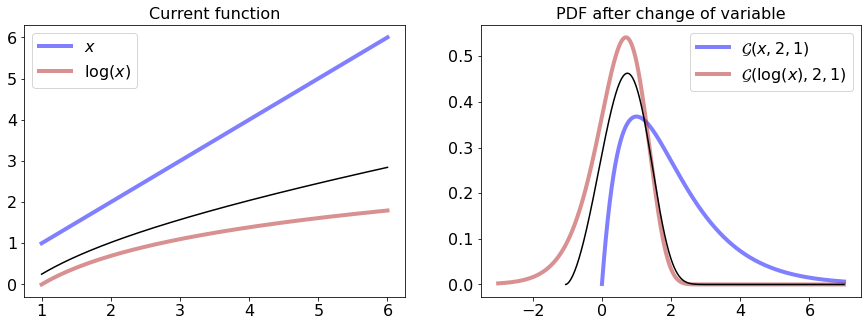

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


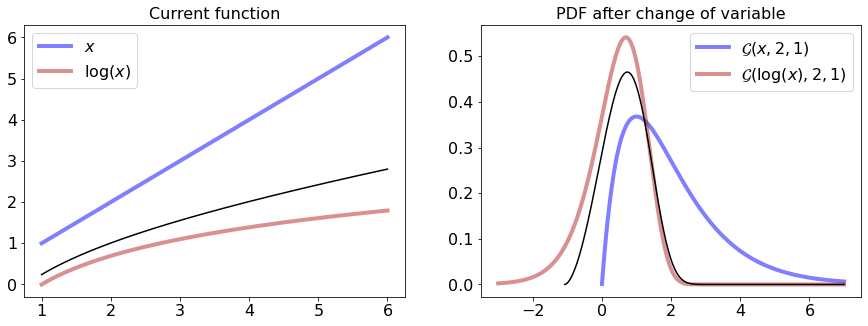

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


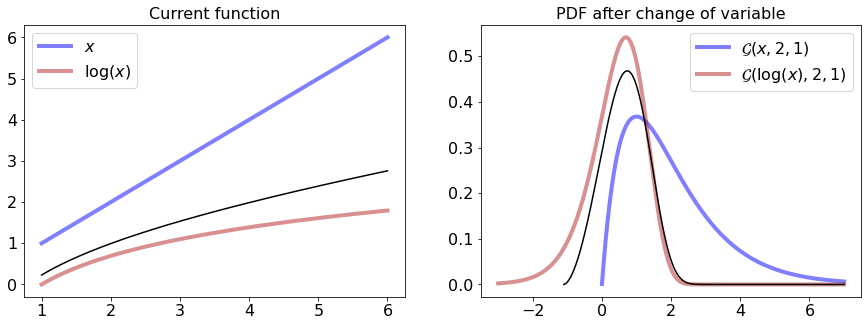

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


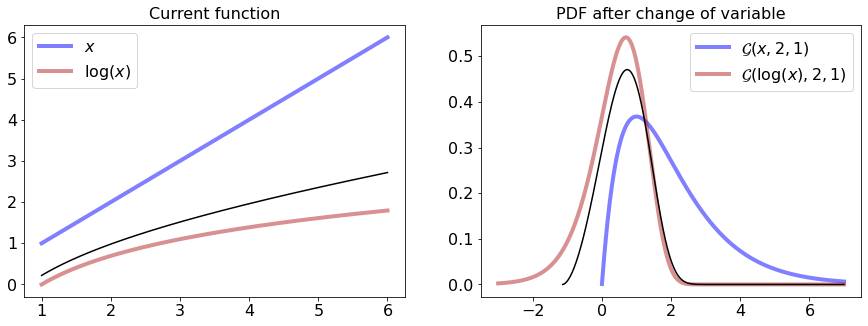

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


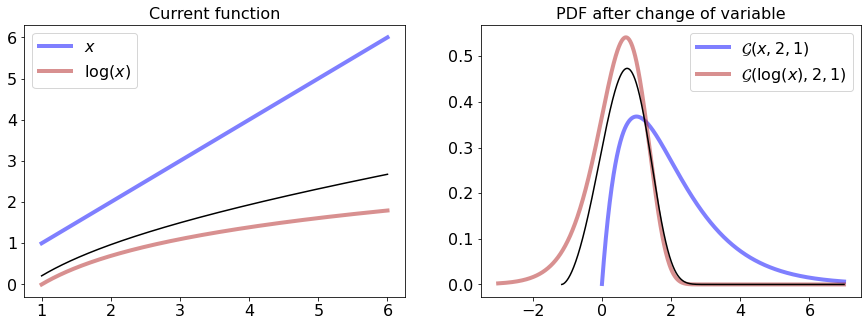

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


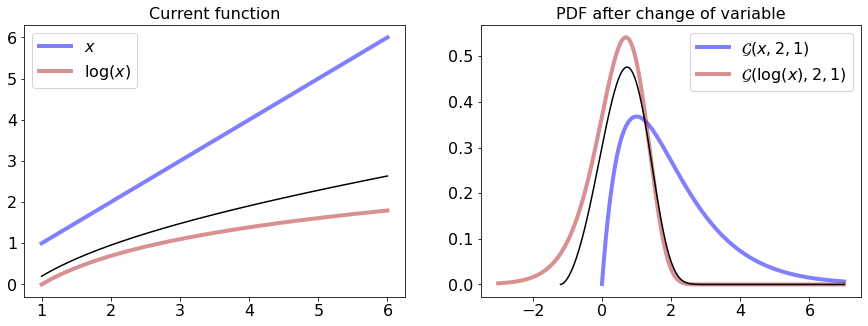

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


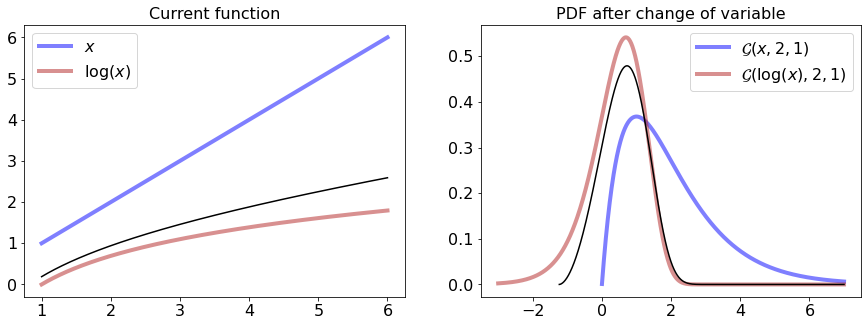

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


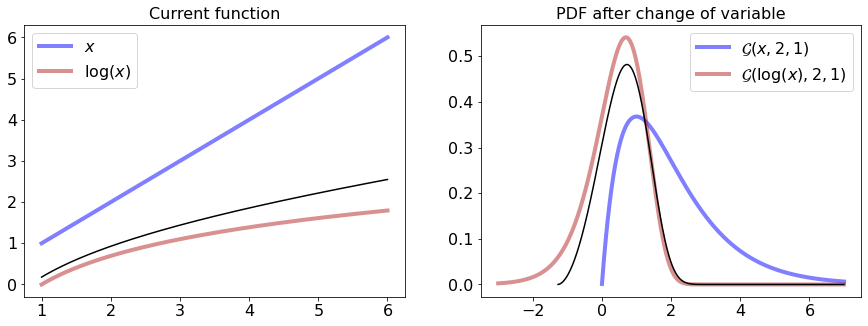

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


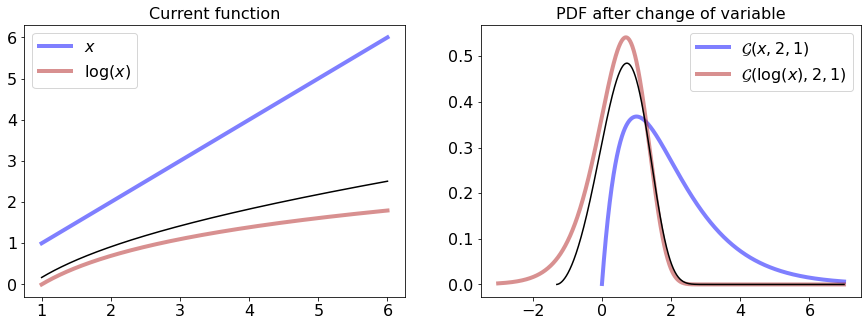

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


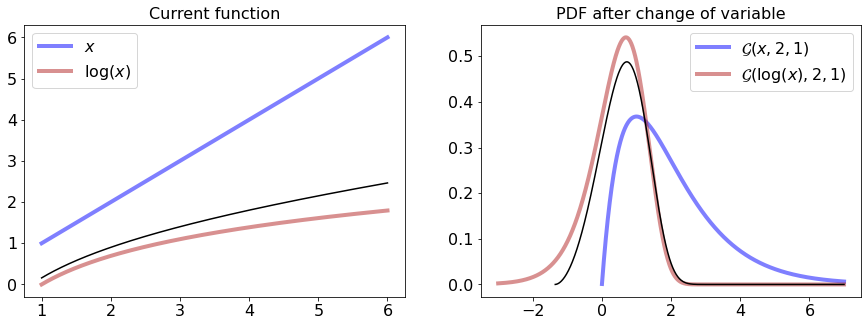

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


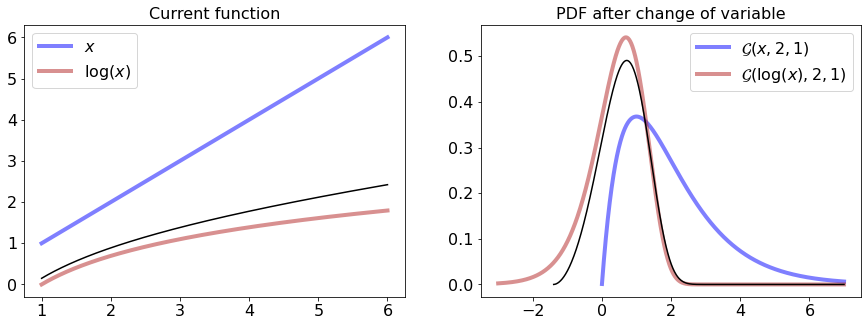

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


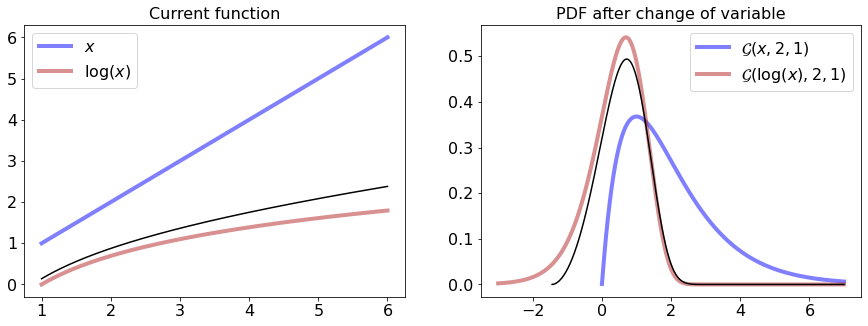

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


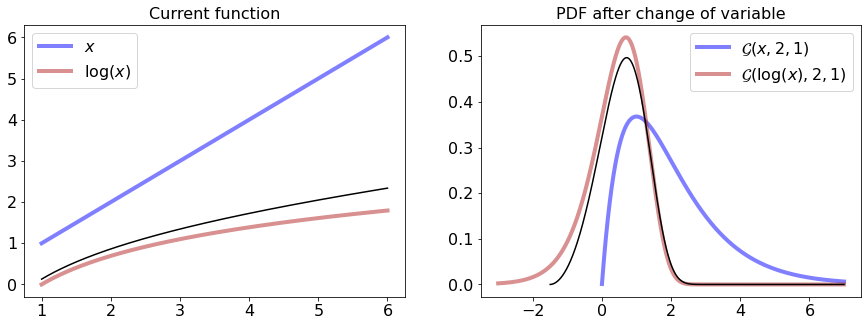

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


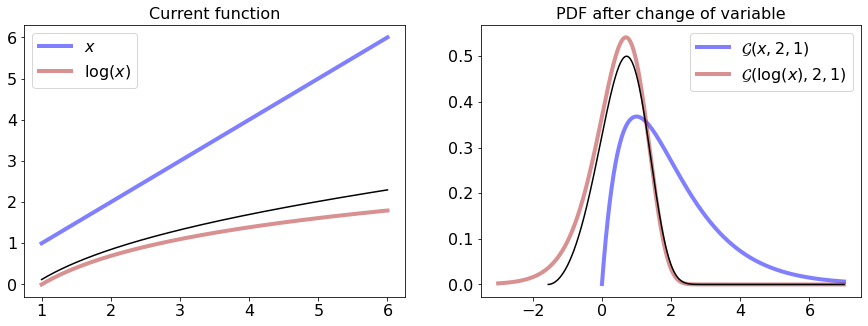

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


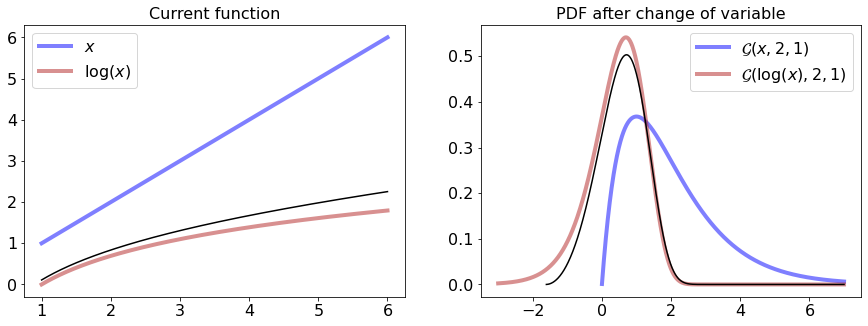

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


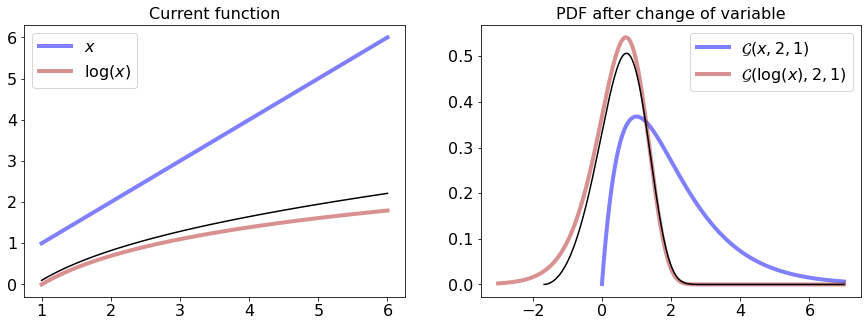

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


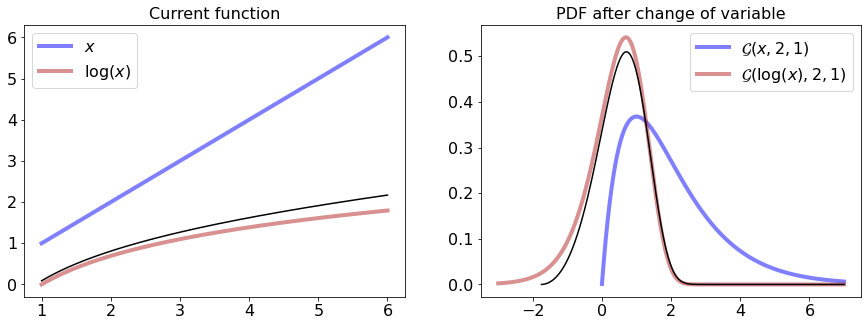

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


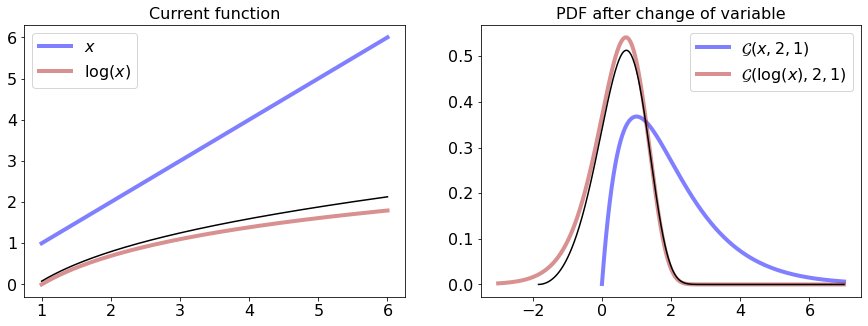

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


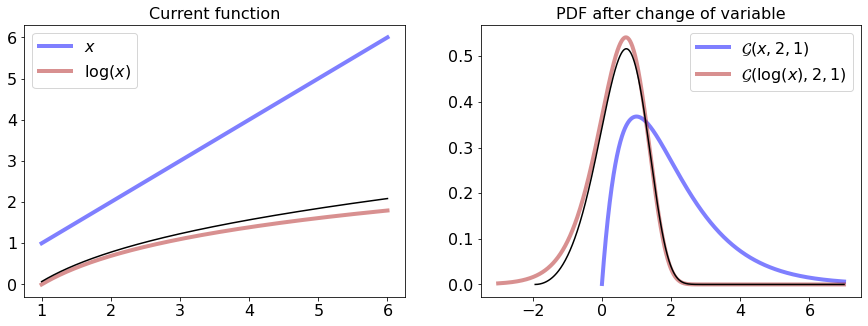

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


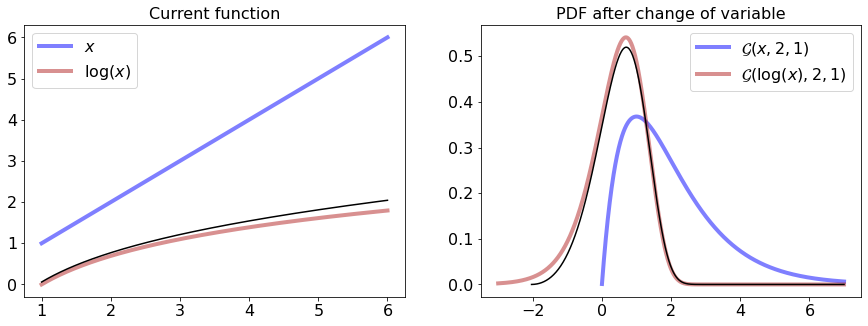

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


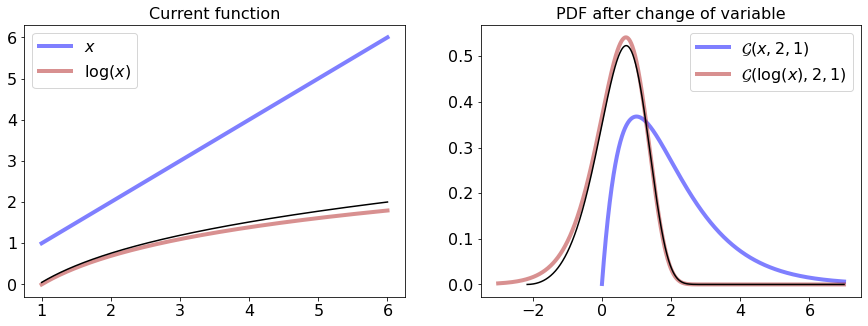

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


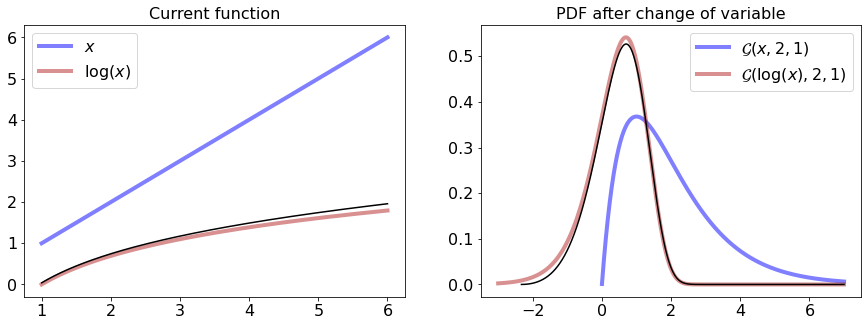

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


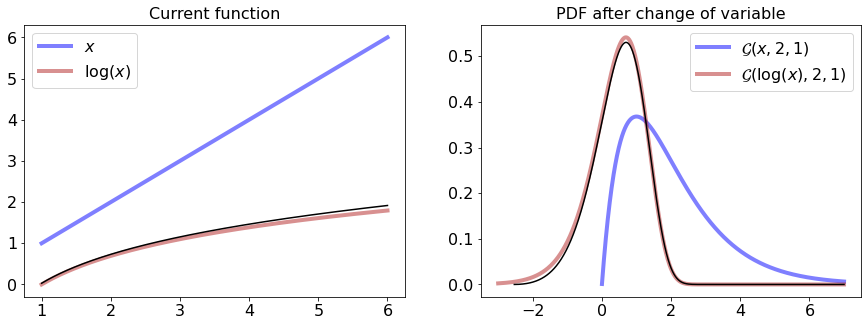

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


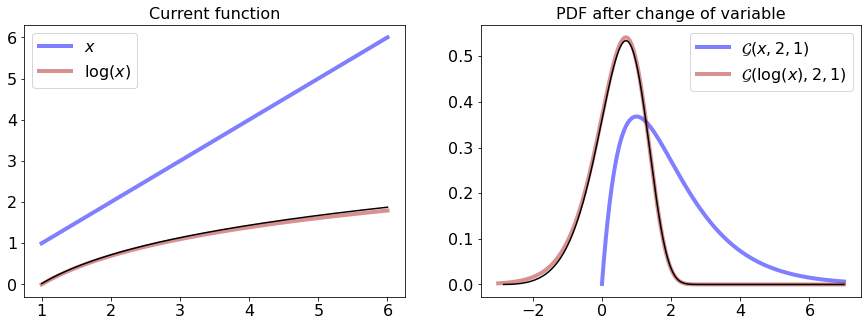

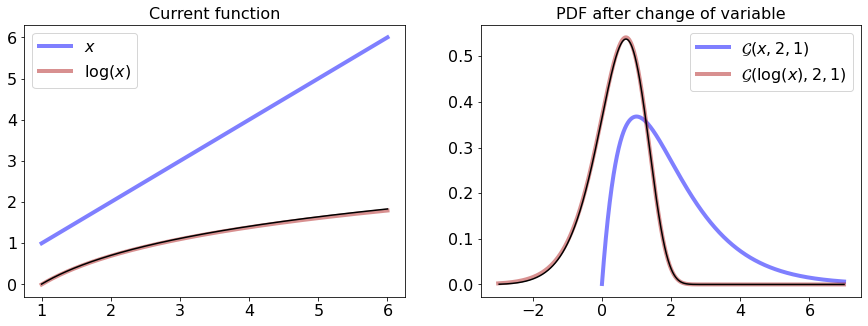

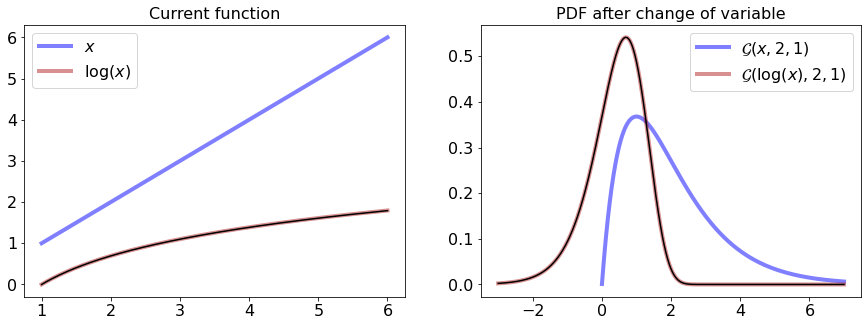

In [11]:
x_P = np.linspace(0.001, 7, 1000+1)
x_R = np.linspace(-3, 7, 1000+1)
ds = np.linspace(0.00001, 0.99999, 100+1)
x_ = np.linspace(1, 6, 1000+1)

gamma1_pdf = gamma_pdf(x_P, a1, l1)
gamma1_pdf_log = gamma_pdf_t_log(x_R, a1, l1)


plt.rc('xtick', labelsize=16)
plt.rc('ytick', labelsize=16)
plt.rc('axes', labelsize=16)
legend_size=16
title_size=16

for d_ in ds:
    
    #compute
    y_a1 = interpolating_log(x_, a=(1-d_))
    y_a1_max = interpolating_log(x_, a=0.001)
    y_a1_min = interpolating_log(x_, a=1)


    lb = d_ * -3
    x_Rd = np.linspace(lb, 7, 1000+1)
    gamma1_pdf_log_d = gamma_pdf_interpolating_log(x_Rd, a1, l1, d=d_)
    
    #plot
    fig, ax = plt.subplots(1, 2, figsize=(15, 5))
    
    ax[0].plot(x_, y_a1_min, lw=4, alpha=0.5, color='blue', label='$x$')
    ax[0].plot(x_, y_a1_max, lw=4, alpha=0.5, color='firebrick', label='$\log(x)$')
    ax[0].plot(x_, y_a1, color='black')
    ax[0].set_title('Current function', size=title_size)
    ax[0].legend(loc='upper left', prop={'size': legend_size})
    
    ax[1].plot(x_P, gamma1_pdf, lw=4, alpha=0.5, color='blue', label='$\mathcal{G}(x, 2,1)$')
    ax[1].plot(x_R, gamma1_pdf_log, lw=4, alpha=0.5, color='firebrick', label='$\mathcal{G}(\log(x), 2,1)$')
    ax[1].plot(x_Rd, gamma1_pdf_log_d, color='black')
    ax[1].set_title('PDF after change of variable', size=title_size)
    ax[1].legend(loc='upper right', prop={'size': legend_size})
    
    plt.show();

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))


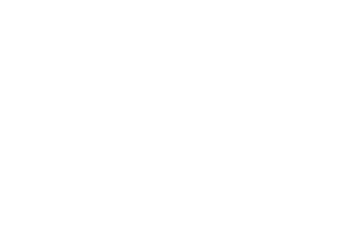

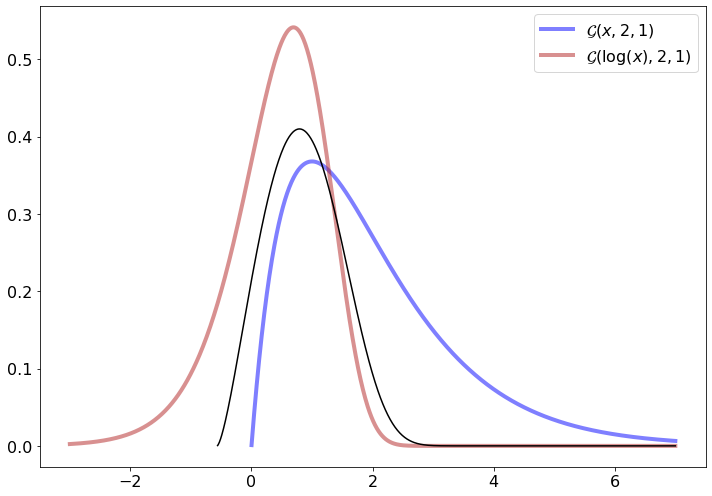

In [13]:
# make an header image
plt.rc('xtick', labelsize=16)
plt.rc('ytick', labelsize=16)
plt.rc('axes', labelsize=16)
plt.axis('off')
legend_size=16
title_size=16

#compute
y_a1 = interpolating_log(x_, a=(1-d_))
y_a1_max = interpolating_log(x_, a=0.001)
y_a1_min = interpolating_log(x_, a=1)


lb = d_ * -3
x_Rd = np.linspace(lb, 7, 1000+1)
gamma1_pdf_log_d = gamma_pdf_interpolating_log(x_Rd, a1, l1, d=0.5)

#plot
plt.figure(figsize=(10, 7))

plt.plot(x_P, gamma1_pdf, lw=4, alpha=0.5, color='blue', label='$\mathcal{G}(x, 2,1)$')
plt.plot(x_R, gamma1_pdf_log, lw=4, alpha=0.5, color='firebrick', label='$\mathcal{G}(\log(x), 2,1)$')
plt.plot(x_Rd, gamma1_pdf_log_d, color='black')
#plt.set_title('PDF after change of variable', size=title_size)
plt.legend(loc='upper right', prop={'size': legend_size})

plt.tight_layout()
plt.savefig('change_of_variable_header.png')
plt.show();

In [12]:
#plot
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
plt.close()

plt.rc('xtick', labelsize=16)
plt.rc('ytick', labelsize=16)
plt.rc('axes', labelsize=16)
legend_size=16
title_size=16

def animate_func(i):
    
    d_ = ds[i]
    #compute
    y_a1 = interpolating_log(x_, a=(1-d_))
    y_a1_max = interpolating_log(x_, a=0.001)
    y_a1_min = interpolating_log(x_, a=1)

    lb = d_ * -3
    x_Rd = np.linspace(lb, 7, 1000+1)
    gamma1_pdf_log_d = gamma_pdf_interpolating_log(x_Rd, a1, l1, d=d_)
    
    ax[0].cla()
    ax[1].cla()
    
    #plot
    ax[0].plot(x_, y_a1_min, lw=4, alpha=0.5, color='blue', label='$x$')
    ax[0].plot(x_, y_a1_max, lw=4, alpha=0.5, color='firebrick', label='$\log(x)$')
    ax[0].plot(x_, y_a1, color='black')
    ax[0].set_title('Current function', size=title_size)
    ax[0].legend(loc='upper left', prop={'size': legend_size})
    
    ax[1].plot(x_P, gamma1_pdf, lw=4, alpha=0.5, color='blue', label='$\mathcal{G}(x, 2,1)$')
    ax[1].plot(x_R, gamma1_pdf_log, lw=4, alpha=0.5, color='firebrick', label='$\mathcal{G}(\log(x), 2,1)$')
    ax[1].plot(x_Rd, gamma1_pdf_log_d, color='black')
    ax[1].set_title('PDF after change of variable', size=title_size)
    ax[1].legend(loc='upper right', prop={'size': legend_size})
    

In [13]:
from matplotlib import animation
from IPython.display import HTML

total_frames=100

# Animation setup
anim = animation.FuncAnimation(
    fig, func=animate_func, frames=total_frames, interval=100, blit=False
)
anim.save('Gamma_log_basis_change.gif', dpi=300)
HTML(anim.to_jshtml())

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, 

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, 

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, 

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, 

<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, d) ** (a-1+d)) * (np.exp(-interpolating_exp(x, d) * l))
<ipython-input-9-81bac5b3bae3>:16: RuntimeWarning: invalid value encountered in power
  r = 1/c * (interpolating_exp(x, 